In [7]:
import numpy as np
import scipy.stats as stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
%matplotlib inline

In [4]:
# importing the dataset

fitbit_df = pd.read_csv('FitBit data.csv')

In [6]:
fitbit_df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [9]:
# seeing the full report about the dataset

fitbit_df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# checking the number of rows and columns in the dataset

fitbit_df.shape

(457, 15)

In [12]:
# checking the missing values

fitbit_df.isna().sum()

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [13]:
fitbit_df1 = fitbit_df.copy()

In [14]:
# checking out the unique activity dates in the dataset
fitbit_df1['ActivityDate'].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [15]:
fitbit_df1['ActivityDate'].head(10)

0    3/25/2016
1    3/26/2016
2    3/27/2016
3    3/28/2016
4    3/29/2016
5    3/30/2016
6    3/31/2016
7     4/1/2016
8     4/2/2016
9     4/3/2016
Name: ActivityDate, dtype: object

In [17]:
# Adding the year, month and date columns to the dataset

fitbit_df1['year'] = pd.DatetimeIndex(fitbit_df1['ActivityDate']).year
fitbit_df1['month'] = pd.DatetimeIndex(fitbit_df1['ActivityDate']).month
fitbit_df1['date'] = pd.DatetimeIndex(fitbit_df1['ActivityDate']).day

In [24]:
# Dataset after transformation

fitbit_df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,date_time,day_name
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,2016-03-25,Friday
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,2016-03-26,Saturday
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,2016-03-27,Sunday
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,2016-03-28,Monday
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,2016-03-29,Tuesday


In [23]:
fitbit_df1['date_time'] = pd.to_datetime(fitbit_df1['ActivityDate'])
fitbit_df1['day_name'] = fitbit_df1['date_time'].dt.day_name()

In [25]:
# drop columns

fitbit_df1 = fitbit_df1.drop(['TrackerDistance'], axis = 1)

### Plotting

Text(0.5, 1.0, 'Box plot of calories with jitter on day of the month')

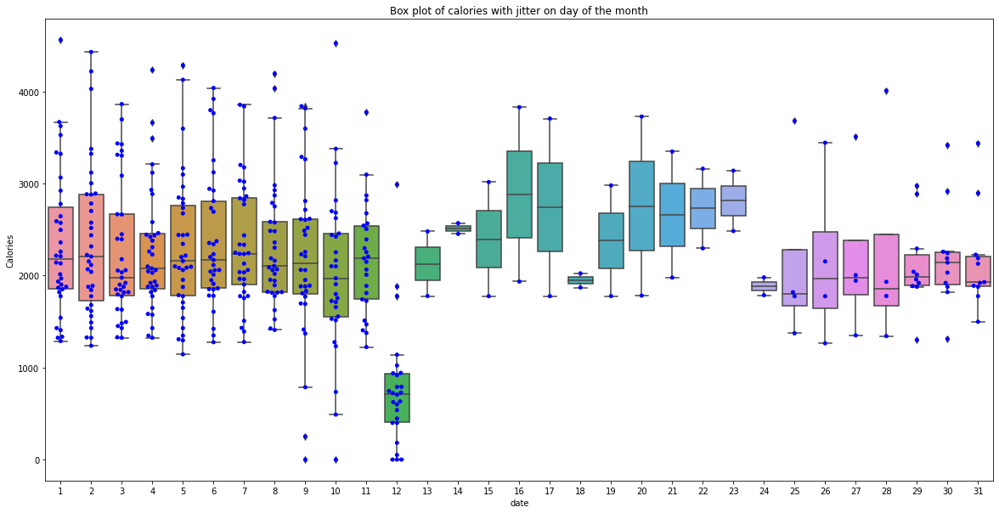

In [34]:
# figure size
plt.figure(figsize=(20,10))

# ususl boxplot
ax = sns.boxplot(x = 'date', y = 'Calories', data = fitbit_df1)

# add jitter with the swarmplot function
ax = sns.swarmplot(x = 'date', y = 'Calories', data = fitbit_df1, color = 'blue')
ax.set_title('Box plot of calories with jitter on day of the month')

Text(0.5, 1.0, 'Box plot of calories with jitter on day of the month')

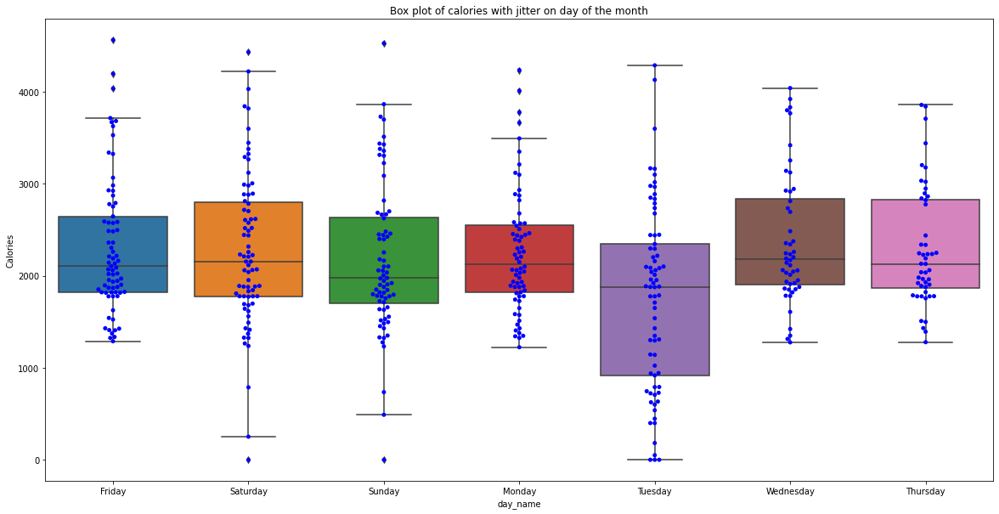

In [37]:
# figure size
plt.figure(figsize=(20,10))

# ususl boxplot
ax = sns.boxplot(x = 'day_name', y = 'Calories', data = fitbit_df1)

# add jitter with the swarmplot function
ax = sns.swarmplot(x = 'day_name', y = 'Calories', data = fitbit_df1, color = 'blue')
ax.set_title('Box plot of calories with jitter on day of the month')

In [40]:
# converting the datatype to datetime

fitbit_df1['week'] = pd.to_datetime(fitbit_df1.ActivityDate).dt.isocalendar().week
fitbit_df1['year'] = pd.to_datetime(fitbit_df1.ActivityDate).dt.year

In [48]:
fitbit_df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,...,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,date_time,day_name,week,day
0,1503960366,2016-03-25,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,...,205,804,1819,2016,3,25,2016-03-25,Friday,12,Friday
1,1503960366,2016-03-26,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,...,274,588,2154,2016,3,26,2016-03-26,Saturday,12,Saturday
2,1503960366,2016-03-27,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,...,268,605,1944,2016,3,27,2016-03-27,Sunday,12,Sunday
3,1503960366,2016-03-28,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,...,224,1080,1932,2016,3,28,2016-03-28,Monday,13,Monday
4,1503960366,2016-03-29,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,...,243,763,1886,2016,3,29,2016-03-29,Tuesday,13,Tuesday


In [44]:
fitbit_df1.ActivityDate.dtype # checking the datatype of ActivityDate field

dtype('O')

In [45]:
# converting ActivityDate to datetime 

fitbit_df1['ActivityDate'] = pd.to_datetime(fitbit_df1['ActivityDate'])

In [47]:
# converting the day of the week to the name of the day
fitbit_df1['day'] = fitbit_df1['ActivityDate'].dt.day_name()

Text(0.5, 1.0, 'Barplot of calories by the day of the week')

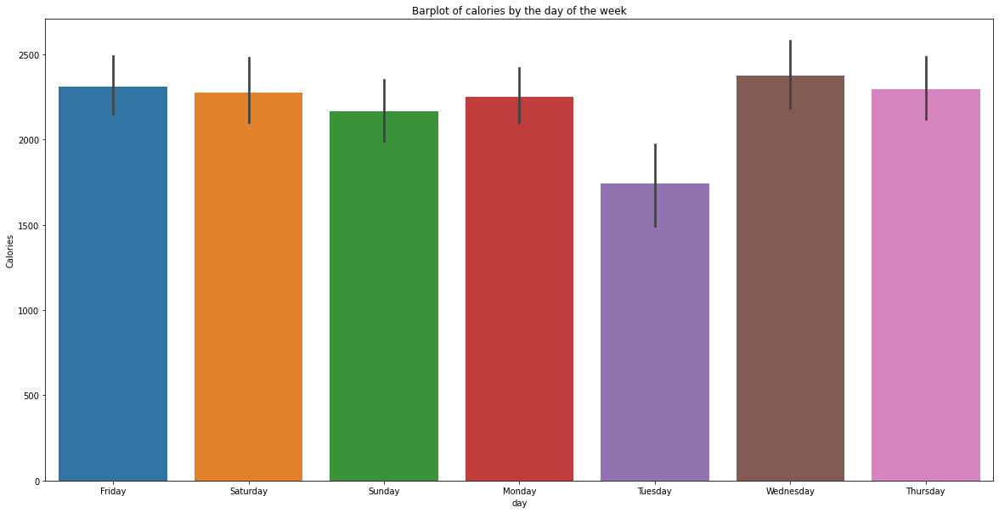

In [49]:
# figure size 
plt.figure(figsize = (20,10))

# simple barplot

ax = sns.barplot(x = 'day', y = 'Calories' , data = fitbit_df1)
ax.set_title('Barplot of calories by the day of the week')

Text(0.5, 1.0, 'Scatterplot of calories and intense activities')

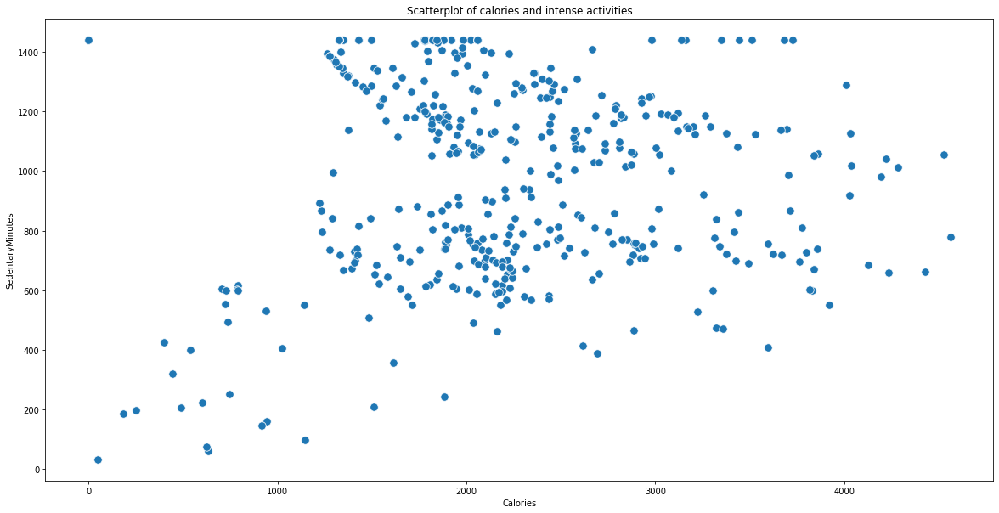

In [55]:
# figure size 
plt.figure(figsize = (20,10))

# simple scatterplot

ax = sns.scatterplot(x = 'Calories', y = 'SedentaryMinutes', data = fitbit_df1, s=90)
ax.set_title('Scatterplot of calories and intense activities')

Text(0.5, 1.0, 'Scatterplot of calories vs Fairly Active Minutes')

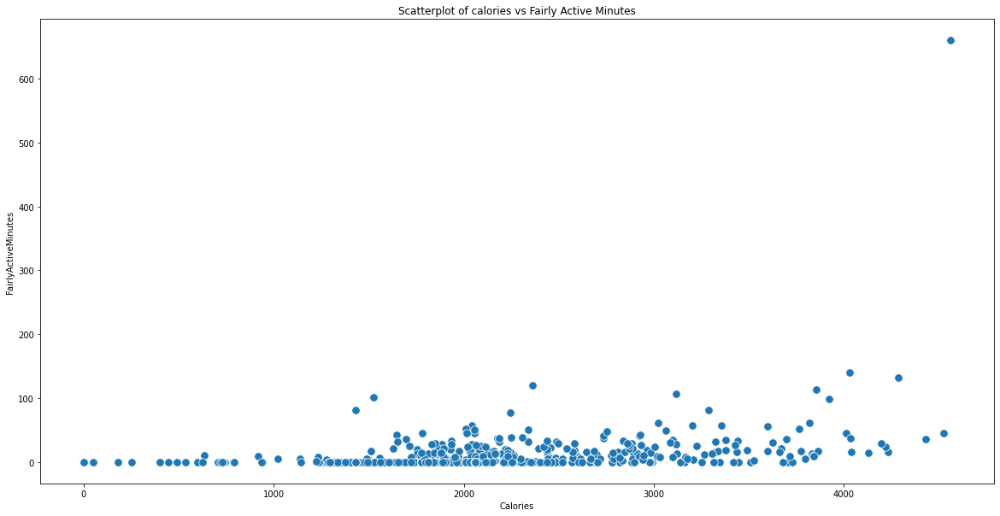

In [57]:
# figure size 
plt.figure(figsize = (20,10))

# simple scatterplot

ax = sns.scatterplot(x = 'Calories', y = 'FairlyActiveMinutes', data = fitbit_df1, s=90)
ax.set_title('Scatterplot of calories vs Fairly Active Minutes')

In [58]:
# dropping the year and week columns

fitbit_df1 = fitbit_df1.drop(['week', 'year'], axis = 1)

In [59]:
fitbit_df1.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'month', 'date',
       'date_time', 'day_name', 'day'],
      dtype='object')

Text(0.5, 1.0, 'Un-normalized value of calories and different activities based on distance')

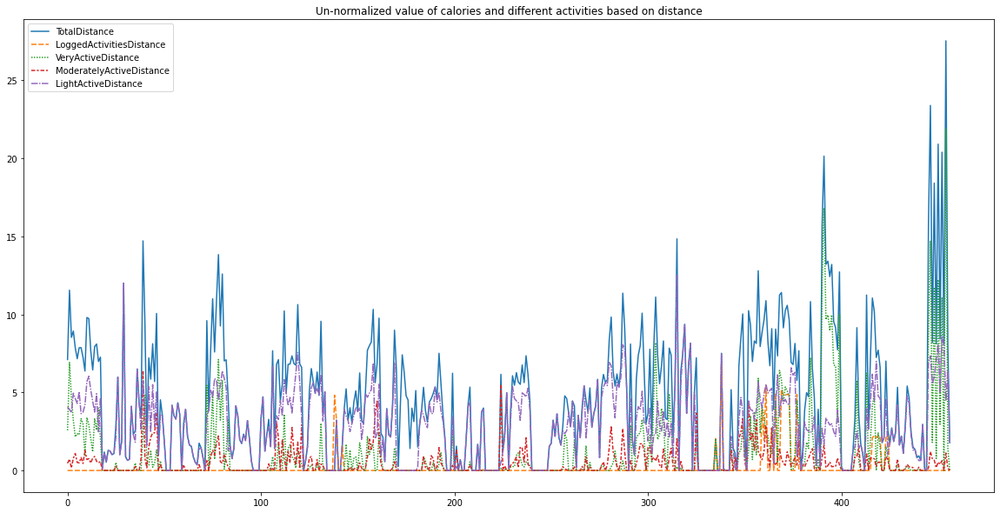

In [64]:
# plot the raw values

rol_select = ['TotalDistance','LoggedActivitiesDistance', 'VeryActiveDistance',
              'ModeratelyActiveDistance', 'LightActiveDistance',]
wide_df = fitbit_df1[rol_select]
# figure size 
plt.figure(figsize = (20,10))

# timeseries plot using lineplot

ax = sns.lineplot(data = wide_df)
ax.set_title('Un-normalized value of calories and different activities based on distance')